In [50]:
import matplotlib.pyplot as plt
import pandas as pd 
import datetime as dt
import pickle

In [51]:
from wordcloud import WordCloud

def plot_wordcloud_from_tweets(preprocessed_tweets):
  text = " ".join(" ".join(tweet) for tweet in preprocessed_tweets)

  # Generate a word cloud image
  wordcloud = WordCloud(stopwords=[], colormap='winter', background_color="black").generate(text)

  # Display the generated image:
  # the matplotlib way:
  plt.figure(figsize=(10,8))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

In [52]:
df = pd.read_csv('reddit_posts_preprocessed_stemmed_2022_04_12-03_12_51_PM.csv')

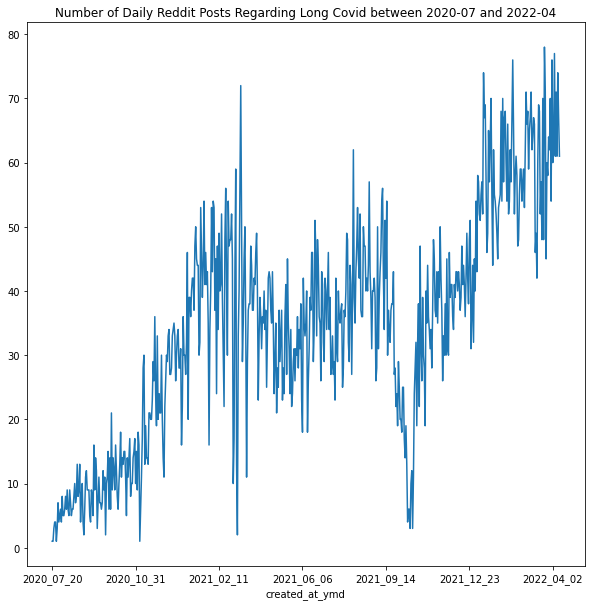

In [53]:
df.groupby(by = ['created_at_ymd']).count()['id'].plot(title="Number of Daily Reddit Posts Regarding Long Covid between 2020-07 and 2022-04", figsize=(10,10))
plt.show()

### Initial Data Visualization

### Data Preprocessing

In [54]:
import re, string, unicodedata
import nltk
import contractions # expanding contractions
import inflect # natural language related tasks of generating plurals, singular nouns, etc.
from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import LancasterStemmer, WordNetLemmatizer
from nltk.tokenize import TweetTokenizer
import string


#nltk.download('punkt')
#nltk.download('stopwords')
#nltk.download('wordnet')

In [55]:
import nltk
#nltk.download('omw-1.4')
nltk.download('averaged_perceptron_tagger')
nltk.download('omw-1.4')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\hayadi\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\hayadi\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [59]:
import sys
sys.path.append("../utils/preprocess")
from preprocess import Preprocess
prep = Preprocess()

In [60]:
preprocessed_reddit_posts = df['preprocessed_selftext']
preprocessed_reddit_posts

0                                ['food', 'best', 'toler']
1        ['current', 'month', '7.5', 'lh', 'voyag', 'br...
2        ['someon', 'suggest', 'post', 'alway', 'want',...
3        ['context', 'covid', 'back', 'late', 'juli', '...
4        ['read', 'lot', 'post', 'sub', 'want', 'preten...
                               ...                        
20883    ['topic', 'picki', 'eater', 'convo', 'today', ...
20884    ['year', 'old', 'sinc', 'februari', 'slowli', ...
20885         ['place', 'member', 'longhaulerkid', 'chat']
20886    ['famili', 'partner', 'kid', 'caught', 'covid'...
20887            ['place', 'member', 'covidlonga', 'chat']
Name: preprocessed_selftext, Length: 20888, dtype: object

In [61]:
preprocessed_titled_reddit_posts = df['preprocessed_titled_selftext']
preprocessed_titled_reddit_posts

0                ['safe', 'food', 'food', 'best', 'toler']
1        ['much', 'exercis', 'current', 'month', '7.5',...
2        ['improv', 'quit', 'lot', 'stop', 'post', 'som...
3        ['lose', '18lbs', 'due', 'longcovid', 'start',...
4        ['symptom', 'debilit', 'still', 'suck', 'relat...
                               ...                        
20883    ['dysgeusia', 'child', 'topic', 'picki', 'eate...
20884    ['longhaul', 'child', 'suffer', 'year', 'old',...
20885    ['longhaulerkid', 'loung', 'place', 'member', ...
20886    ['vaccin', 'long', 'hauler', 'kid', 'famili', ...
20887    ['covidlonga', 'loung', 'place', 'member', 'co...
Name: preprocessed_titled_selftext, Length: 20888, dtype: object

In [62]:
import gensim
from gensim.utils import simple_preprocess
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hayadi\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [63]:
custom_stop_words = ['covid', 'symptom', 'like', 'feel', 'day', 'month', 'anyone', 'long', 
                     'time', 'week', 'back', 'test', 'start', 'know', 'would', 'think', 'since']

def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) 
             if word not in custom_stop_words] for doc in texts]

data_words = remove_stopwords(preprocessed_reddit_posts)
titled_data_words = remove_stopwords(df['preprocessed_titled_selftext'])

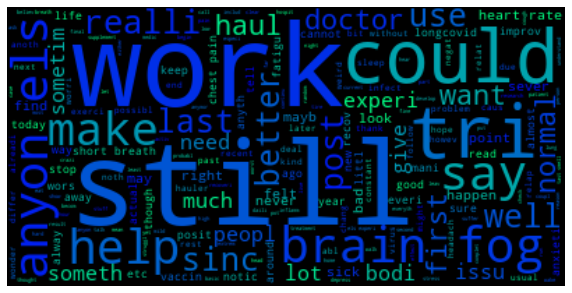

In [64]:
plot_wordcloud_from_tweets(data_words)

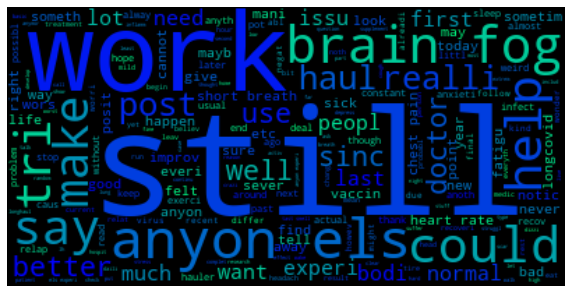

In [65]:
plot_wordcloud_from_tweets(titled_data_words)

In [66]:
# Use list comprehension to convert a list of lists to a flat list 
all_words = [item for elem in data_words for item in elem]
titled_all_words = [item for elem in titled_data_words for item in elem]

In [45]:
from collections import Counter
word_frequencies = Counter(all_words)
len(word_frequencies)

20758

In [46]:
word_frequencies.most_common()

[('anyon', 9278),
 ('pain', 8147),
 ('help', 7595),
 ('still', 6752),
 ('work', 6441),
 ('sinc', 6180),
 ('experi', 5996),
 ('tri', 5876),
 ('heart', 5788),
 ('make', 5767),
 ('realli', 5691),
 ('could', 5673),
 ('doctor', 5633),
 ('issu', 5459),
 ('say', 5388),
 ('brain', 5269),
 ('better', 5239),
 ('breath', 4931),
 ('normal', 4923),
 ('fatigu', 4888),
 ('last', 4772),
 ('els', 4768),
 ('want', 4694),
 ('post', 4588),
 ('much', 4569),
 ('peopl', 4480),
 ('cannot', 4480),
 ('bodi', 4461),
 ('felt', 4413),
 ('year', 4412),
 ('chest', 4303),
 ('first', 4249),
 ('find', 3865),
 ('vaccin', 3836),
 ('bad', 3737),
 ('sleep', 3680),
 ('never', 3593),
 ('blood', 3555),
 ('anxieti', 3552),
 ('fog', 3542),
 ('lot', 3461),
 ('wors', 3446),
 ('someth', 3418),
 ('posit', 3293),
 ('smell', 3292),
 ('anyth', 3228),
 ('haul', 3183),
 ('tell', 3170),
 ('use', 3166),
 ('around', 3112),
 ('sick', 3104),
 ('well', 3096),
 ('infect', 3095),
 ('life', 3068),
 ('ago', 2910),
 ('everi', 2881),
 ('give', 2860

In [53]:
#see that index for assessing topic modeling algorithms or for choosing the value of n (the number of topics to work on) 

### Co-occurences 

### Vaccination exploration

In [273]:
import re

search_list = ["vaccine","vaccinated","pfizer","Astrazeneca","covidvaccine","COVID19Vaccine","Johnson and Johnson","Johnson & Johnson",
            "JNJ","covidvaccination","getvaccinated","vaccination ","vaccination","Janssen","ModernaVaccine",
            "Moderna","Fullyvaccinated","pfizervaccine","covidvaccine","firstshot","halfvaxxed","teampfizer","vaccineswork",
            "abvax","OSE Immunotherapeutics","CoVepiT","covepit","Sinopharm","Sinopharm","covid19vaccination","Gamaleya",
            "Gamaleya","SputnikV","RussianVaccine","CovidVaccineRace","Novavax","Novavax","Elixirgen Therapeutics","mRNA vaccine",
            "mRNAvaccine","#vaccinessaveslives","NanoVaccine","ChAdOx1","ChAdOx1","Ad5 vaccine","Ad5vaccine","Ad26 vaccine",
            "Ad26vaccine","protein vaccine","proteinvaccine","DNAvaccine","Bigpharma","zeroliabilityvaccine","vaccinesafety",
            "vaccinesideeffects","vaccinekills","kidsarenotguineapigs","DumbParentsVaccinate","SayNoToCovidVaccination","VaccinesCauseAutism",
            "vaccineinjury","vaccinesarepoison","RfidVaccine","DoNotVaccine","covidwakeup","stopvaccine","feardemic",
            "NoVaccinePassports","StopBigPharma","covidisfake","COVIDISNTREAL","fakevaccine","covid5g","5gcoronavirus",
            "hoaxcovid","COVIDIDIOTS","covidishoax","vaccin","vaccins","Astrazenika","Impfluencer"]


In [274]:
df['preprocessed_titled_selftext_full'] = df['preprocessed_titled_selftext'].apply(lambda x: ' '.join(x)) 

In [275]:
df['vaccine_relevant'] = False * len(df)

In [276]:
def is_vaccine_relevant(x):
    if re.compile('|'.join(search_list),re.IGNORECASE).search(x):
        return True
    else:
        return False

In [277]:
df['vaccine_relevant'] = df['preprocessed_titled_selftext_full'].apply(lambda x: is_vaccine_relevant(x))

In [279]:
df_vaccine_relevant = df[df['vaccine_relevant']==True]

In [301]:
df_vaccine_relevant

,_id,subreddit,author,date,post,title,upvote_ratio,all_awardings,allow_live_comments,author_flair_css_class,...,event_end,event_is_live,event_start,selftext_titled,created_at_ymd,preprocessed_selftext,preprocessed_titled_selftext,titled_selftext,preprocessed_titled_selftext_full,vaccine_relevant
10,625413df1cf1750023943edc,covidlonghaulers,MingoUSA,NaN,NaN,How I recovered from daily low fever,1.0,[],0.0,None,...,NaN,NaN,NaN,How I recovered from daily low feverI’m 38 mal...,2021_09_11,"[male, covid, back, april, long, haul, symptom...","[recover, daily, low, fever, male, covid, back...",How I recovered from daily low fever I’m 38 ma...,recover daily low fever male covid back april ...,True
17,625413df1cf1750023943ee3,covidlonghaulers,Remarkable-Area-6712,NaN,NaN,7 days after 2nd reinfection after 9 months of...,1.0,[],0.0,None,...,NaN,NaN,NaN,7 days after 2nd reinfection after 9 months of...,2021_09_11,"[swcond, dose, od, pfizer, day, today, like, 7...","[day, 2nd, reinfection, month, lh, finish, vac...",7 days after 2nd reinfection after 9 months of...,day 2nd reinfection month lh finish vaccinatio...,True
19,625413df1cf1750023943ee5,covidlonghaulers,reddithatesmee,NaN,NaN,"Careful with your water, kids!",1.0,[],0.0,None,...,NaN,NaN,NaN,"Careful with your water, kids!Long story short...",2021_09_11,"[long, story, short, land, er, yesterday, thin...","[careful, water, kid, long, story, short, land...","Careful with your water, kids! Long story shor...",careful water kid long story short land er yes...,True
23,625413df1cf1750023943ee9,covidlonghaulers,TransportationIll990,NaN,NaN,Post vax long hauler,1.0,[],0.0,None,...,NaN,NaN,NaN,Post vax long haulerHello soon i will be 4 mon...,2021_09_11,"[hello, soon, month, long, haul, vax, main, sy...","[post, vax, long, hauler, hello, soon, month, ...",Post vax long hauler Hello soon i will be 4 mo...,post vax long hauler hello soon month long hau...,True
25,625413df1cf1750023943eeb,covidlonghaulers,NoTownChamp,NaN,NaN,Constant Headache after Pfizer Vaccine?,1.0,[],0.0,None,...,NaN,NaN,NaN,Constant Headache after Pfizer Vaccine?I will ...,2021_09_11,"[try, keep, brief, mri, ct, scan, already, fin...","[constant, headache, pfizer, vaccine, try, kee...",Constant Headache after Pfizer Vaccine? I will...,constant headache pfizer vaccine try keep brie...,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20802,62541eab1cf1750023949014,LongHaulersRecovery,poofycade,NaN,NaN,“I'm fully recovered and back to living my life”,1.0,[],0.0,None,...,NaN,NaN,NaN,“I'm fully recovered and back to living my lif...,2021_09_01,"[author, post, repost, hello, fully, recover, ...","[fully, recover, back, live, life, author, pos...",“I'm fully recovered and back to living my lif...,fully recover back live life author post repos...,True
20809,62541eab1cf175002394901b,LongHaulersRecovery,poofycade,NaN,NaN,Mostly recovered after 18 months. Here’s my st...,1.0,[],0.0,None,...,NaN,NaN,NaN,Mostly recovered after 18 months. Here’s my st...,2021_09_02,"[mostly, recover, month, story, covid, decembe...","[mostly, recover, month, story, mostly, recove...",Mostly recovered after 18 months. Here’s my st...,mostly recover month story mostly recover mont...,True
20811,62541eab1cf175002394901d,LongHaulersRecovery,Zenpunk85,NaN,NaN,95% Recovery due to B12 and Mineral Replenishm...,1.0,[],0.0,None,...,NaN,NaN,NaN,95% Recovery due to B12 and Mineral Replenishm...,2022_02_25,"[tldr, long, covid, since, march, nyc, strain,...","[recovery, due, b12, mineral, replenishment, p...",95% Recovery due to B12 and Mineral Replenishm...,recovery due b12 mineral replenishment protoco...,True
20813,62541eab1cf175002394901f,LongHaulersRecovery,cookie_doughx,NaN,NaN,Asthma after Covid,1.0,[],0.0,None,...,NaN,NaN,NaN,"Asthma after CovidI had Covid in January 2021,...",2022_03_11,"[covid, january, ever, since, lung, area, symp...","[asthma, covid, covid, january, ever, since, l...",Asthma after Covid I had

In [281]:
titled_data_words = remove_stopwords(df_vaccine_relevant['preprocessed_titled_selftext'])

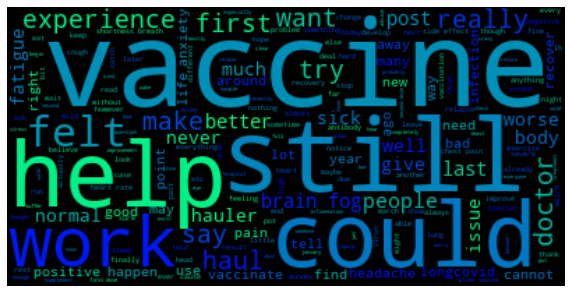

In [282]:
plot_wordcloud_from_tweets(titled_data_words)

### Clustering: Word2vec + KMEANS

In [23]:
from gensim.models import Word2Vec
from gensim.models import FastText
from gensim.models import KeyedVectors

wv = KeyedVectors.load('COVID19_300d_vectors.kv')

In [24]:
wv['symptom']

array([-0.09124538, -0.12339554, -0.02042282, -0.0452335 ,  0.0100937 ,
        0.37753525,  0.08430892,  0.46792048, -0.07612645, -0.01021958,
       -0.23734401,  0.11688322,  0.35885745, -0.25988826, -0.24963477,
       -0.23542428,  0.06967404,  0.32457596,  0.07144403, -0.31179878,
        0.21094969,  0.32798937,  0.41394004, -0.1170045 , -0.12054513,
        0.33216935,  0.11178789, -0.2264724 , -0.19564256, -0.01705394,
       -0.19561294, -0.06728314,  0.39465314, -0.14601712,  0.33177704,
        0.31195658,  0.28917205, -0.11975207, -0.16950636,  0.22180109,
       -0.03485585, -0.19447607,  0.24723239,  0.1141984 ,  0.52872336,
        0.45376933, -0.20037864,  0.1734016 ,  0.17864254,  0.20615157,
        0.6039827 ,  0.10693544,  0.01120058,  0.15877086, -0.19165513,
        0.01479901, -0.24002221,  0.00594713, -0.01999766, -0.12987138,
       -0.10318439, -0.48491615,  0.09356822,  0.4249716 ,  0.35673094,
       -0.09989565,  0.27526549,  0.24018824,  0.14963807,  0.05

In [25]:
wv.most_similar('covid')

[('coronavirus', 0.8326214551925659),
 ('coivd', 0.6089828610420227),
 ('the', 0.6045603156089783),
 ('and', 0.5934354662895203),
 ('also', 0.5755143165588379),
 ('in', 0.5592482089996338),
 ('via', 0.5564996004104614),
 ('virus', 0.550850510597229),
 ('for', 0.5384274125099182),
 ('of', 0.535706102848053)]

In [26]:
wv.most_similar('pain')

[('pains', 0.7013640999794006),
 ('agony', 0.6789065599441528),
 ('painloss', 0.6243266463279724),
 ('lethergy', 0.6213481426239014),
 ('tireness', 0.6150373220443726),
 ('jointmuscle', 0.6118592619895935),
 ('memoryconcentration', 0.6116151213645935),
 ('numbness', 0.6088774800300598),
 ('ache', 0.608733057975769),
 ('anguish', 0.6007505655288696)]

In [27]:
wv.most_similar('work')

[('working', 0.6757529973983765),
 ('workand', 0.511583685874939),
 ('worked', 0.49641305208206177),
 ('towork', 0.49441254138946533),
 ('works', 0.46657517552375793),
 ('robotshop', 0.4629283547401428),
 ('job', 0.4603615701198578),
 ('afristar', 0.45701682567596436),
 ('wrk', 0.45642539858818054),
 ('worki', 0.455613911151886)]

In [28]:
import numpy as np

def vectorize(list_of_docs, model):
    """Generate vectors for list of documents using a Word Embedding

    Args:
        list_of_docs: List of documents
        model: Gensim's Word Embedding

    Returns:
        List of document vectors
    """
    features = []

    for tokens in list_of_docs:
        zero_vector = np.zeros(model.vector_size)
        vectors = []
        for token in tokens:
            try:
                if token in model.wv:
                    try:
                        vectors.append(model.wv[token])
                    except KeyError:
                        continue
            except Exception as e:
                print(e)
                if token in model:
                    try:
                        vectors.append(model[token])
                    except KeyError:
                        continue
                
        if vectors:
            vectors = np.asarray(vectors)
            avg_vec = vectors.mean(axis=0)
            features.append(avg_vec)
        else:
            features.append(zero_vector)
    return features

In [29]:
vectorized_docs = vectorize(preprocessed_reddit_posts, model=wv)
len(vectorized_docs), len(vectorized_docs[0])

'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no att

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no att

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no attribute 'wv'
'KeyedVectors' object has no att

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(20888, 300)

In [30]:
def mbkmeans_clusters(
	X, 
    k, 
    mb, 
    print_silhouette_values, 
):
    """Generate clusters and print Silhouette metrics using MBKmeans

    Args:
        X: Matrix of features.
        k: Number of clusters.
        mb: Size of mini-batches.
        print_silhouette_values: Print silhouette values per cluster.

    Returns:
        Trained clustering model and labels based on X.
    """
    km = MiniBatchKMeans(n_clusters=k, batch_size=mb).fit(X)
    print(f"For n_clusters = {k}")
    print(f"Silhouette coefficient: {silhouette_score(X, km.labels_):0.2f}")
    print(f"Inertia:{km.inertia_}")

    if print_silhouette_values:
        sample_silhouette_values = silhouette_samples(X, km.labels_)
        print(f"Silhouette values:")
        silhouette_values = []
        for i in range(k):
            cluster_silhouette_values = sample_silhouette_values[km.labels_ == i]
            silhouette_values.append(
                (
                    i,
                    cluster_silhouette_values.shape[0],
                    cluster_silhouette_values.mean(),
                    cluster_silhouette_values.min(),
                    cluster_silhouette_values.max(),
                )
            )
        silhouette_values = sorted(
            silhouette_values, key=lambda tup: tup[2], reverse=True
        )
        for s in silhouette_values:
            print(
                f"    Cluster {s[0]}: Size:{s[1]} | Avg:{s[2]:.2f} | Min:{s[3]:.2f} | Max: {s[4]:.2f}"
            )
    return km, km.labels_

In [41]:
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples


clustering, cluster_labels = mbkmeans_clusters(
	X=vectorized_docs,
    k=3,
    mb=500,
    print_silhouette_values=True,
)

For n_clusters = 3
Silhouette coefficient: 0.07
Inertia:15070.95573023658
Silhouette values:
    Cluster 0: Size:12180 | Avg:0.14 | Min:0.01 | Max: 0.28
    Cluster 2: Size:4389 | Avg:0.01 | Min:-0.07 | Max: 0.19
    Cluster 1: Size:4319 | Avg:-0.08 | Min:-0.21 | Max: 0.07


In [42]:
df_clusters = pd.DataFrame({
    "text": posts_to_process,
    "tokens": [" ".join(text) for text in preprocessed_reddit_posts],
    "cluster": cluster_labels
})

In [43]:
df_clusters

,text,tokens,cluster
0,what foods do you best tolerate?,foods best tolerate,0
1,I'm currently on month 7.5 of my LH voyage. Br...,currently month 7.5 lh voyage breathe issue br...,0
2,"Someone suggested I posted this, which I’ve al...",someone suggest post always want recover bette...,0
3,"For context, I got covid back in late July 202...",context covid back late july two thousand and ...,0
4,I have read a lot of posts on this sub. I don'...,read lot post sub want pretend anywhere near w...,0
...,...,...,...
20883,The topic of a 7 y/o picky eater came up in a ...,topic seven picky eater convo today later real...,2
20884,I have a 7 and 5 year old who since February h...,seven five year old since february slowly deve...,1
20885,A place for members of r/LongHaulerKids to cha...,place member longhaulerkids chat,0
20886,"My family (partner, kid and I) caught Covid in...",family partner kid caught covid march two thou...,0


In [44]:
from sklearn.decomposition import PCA

# initialize PCA with 2 components
pca = PCA(n_components=2, random_state=42)
# pass our X to the pca and store the reduced vectors into pca_vecs
pca_vecs = pca.fit_transform(vectorized_docs)
# save our two dimensions into x0 and x1
x0 = pca_vecs[:, 0]
x1 = pca_vecs[:, 1]

In [45]:
df_clusters['x0'] = x0
df_clusters['x1'] = x1
df_clusters

,text,tokens,cluster,x0,x1
0,what foods do you best tolerate?,foods best tolerate,0,-0.165260,0.010221
1,I'm currently on month 7.5 of my LH voyage. Br...,currently month 7.5 lh voyage breathe issue br...,0,-0.186677,0.030994
2,"Someone suggested I posted this, which I’ve al...",someone suggest post always want recover bette...,0,-0.028097,-0.091953
3,"For context, I got covid back in late July 202...",context covid back late july two thousand and ...,0,-0.016047,0.038874
4,I have read a lot of posts on this sub. I don'...,read lot post sub want pretend anywhere near w...,0,0.112287,-0.060543
...,...,...,...,...,...
20883,The topic of a 7 y/o picky eater came up in a ...,topic seven picky eater convo today later real...,2,0.150490,0.083782
20884,I have a 7 and 5 year old who since February h...,seven five year old since february slowly deve...,1,0.019410,0.222536
20885,A place for members of r/LongHaulerKids to cha...,place member longhaulerkids chat,0,-0.607406,0.115783
20886,"My family (partner, kid and I) caught Covid in...",family partner kid caught covid march two thou...,0,-0.044952,0.006899


In [46]:
# map clusters to appropriate labels 
cluster_map = {0: "cluster_1", 1: "cluster_2"}
# apply mapping
df_clusters['cluster'] = df_clusters['cluster'].map(cluster_map)

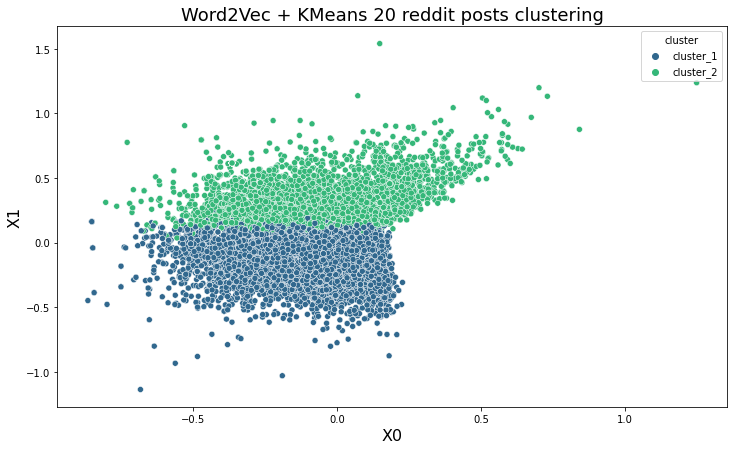

In [47]:
import seaborn as sns 
# set image size
plt.figure(figsize=(12, 7))
# set a title
plt.title("Word2Vec + KMeans 20 reddit posts clustering", fontdict={"fontsize": 18})
# set axes names
plt.xlabel("X0", fontdict={"fontsize": 16})
plt.ylabel("X1", fontdict={"fontsize": 16})
# create scatter plot with seaborn, where hue is the class used to group the data
sns.scatterplot(data=df_clusters, x='x0', y='x1', hue='cluster', palette="viridis")
plt.show()

In [49]:
df_clusters[df_clusters['cluster'] == 'cluster_1']

,text,tokens,cluster,x0,x1
0,what foods do you best tolerate?,foods best tolerate,cluster_1,-0.165260,0.010221
1,I'm currently on month 7.5 of my LH voyage. Br...,currently month 7.5 lh voyage breathe issue br...,cluster_1,-0.186677,0.030994
2,"Someone suggested I posted this, which I’ve al...",someone suggest post always want recover bette...,cluster_1,-0.028097,-0.091953
3,"For context, I got covid back in late July 202...",context covid back late july two thousand and ...,cluster_1,-0.016047,0.038874
4,I have read a lot of posts on this sub. I don'...,read lot post sub want pretend anywhere near w...,cluster_1,0.112287,-0.060543
...,...,...,...,...,...
20877,So around August I was diagnosed with COVID an...,around august diagnose covid week sick recomme...,cluster_1,0.029845,0.021439
20879,"9 month LH , male 23 yrld. All my symptoms are...",nine month lh male twenty-three yrld symptom n...,cluster_1,0.020318,0.015019
20885,A place for members of r/LongHaulerKids to cha...,place member longhaulerkids chat,cluster_1,-0.607406,0.115783
20886,"My family (partner, kid and I) caught Covid in...",family partner kid caught covid march two thou...,cluster_1,-0.044952,0.006899


In [50]:
for _, row in df_clusters[df_clusters['cluster'] == 'cluster_1'].iterrows():
    print(row['tokens'])

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



five month gut gurgle almost day long mostly consume food lay anybody tip rid try probiotic really anything start l-glutamine today bone broth
lower back pain nearly week worse improve either feel stand walk day hurt bend make certain movement rheumatologist week ago say may due atrophy longcovid temporal neuropathy convinced appointment care much either time deal earache week ago well otorhinolaryngology day rheumatologist pain left ear extend left side head start become uncomfortable painful due suspect inflammation diagnose otitis major buildup ear wax give drop ear nasal spray continue treat feel instant relief removal earwax notice least day feel sudden ear pain left ear sometimes right well last long confirmation still deal something someone deal symptom able cure month symptom away newer annoy appointment family doctor next week bring issue
lower back pain nearly week worse improve either feel stand walk day hurt bend make certain movement rheumatologist week ago say may due atr

### Co_occurences

,_id,subreddit,author,date,post,title,upvote_ratio,all_awardings,allow_live_comments,author_flair_css_class,...,thumbnail_height,thumbnail_width,call_to_action,category,event_end,event_is_live,event_start,selftext_titled,created_at_ymd,preprocessed_selftext
0,625413df1cf1750023943ed2,covidlonghaulers,sleepy55555,NaN,NaN,what are your safe food?,1.0,[],0.0,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,what are your safe food?what foods do you best...,2021_09_11,"[foods, best, tolerate]"
1,625413df1cf1750023943ed3,covidlonghaulers,rovingburrito,NaN,NaN,How Much are Y'all Exercising?,1.0,[],0.0,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,How Much are Y'all Exercising?I'm currently on...,2021_09_11,"[currently, month, 7.5, lh, voyage, breathe, i..."
2,625413df1cf1750023943ed4,covidlonghaulers,Quittercricket,NaN,NaN,I’m one of those who improved quite a lot and ...,1.0,[],0.0,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I’m one of those who improved quite a lot and ...,2021_09_11,"[someone, suggest, post, always, want, recover..."
3,625413df1cf1750023943ed5,covidlonghaulers,FlimsyBandicoot5021,NaN,NaN,"Lost 18lbs due to long covid, but started gain...",1.0,[],0.0,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Lost 18lbs due to long covid, but started gain...",2021_09_11,"[context, covid, back, late, july, two thousan..."
4,625413df1cf1750023943ed6,covidlonghaulers,gamblingmysalary,NaN,NaN,My symptoms aren't debilitating but it still s...,1.0,[],0.0,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,My symptoms aren't debilitating but it still s...,2021_09_11,"[read, lot, post, sub, want, pretend, anywhere..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20883,6254302b1cf1750023949065,LongHaulerKids,zhulinxian,NaN,NaN,Dysgeusia in children?,1.0,[],0.0,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Dysgeusia in children?The topic of a 7 y/o pic...,2021_12_19,"[topic, seven, picky, eater, convo, today, lat..."
20884,6254302b1cf1750023949066,LongHaulerKids,Baron-Munc,NaN,NaN,I’m a longhauler my children suffer too,1.0,[],0.0,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I’m a longhauler my children suffer tooI have ...,2021_01_24,"[seven, five, year, old, since, february, slow..."
20885,6254302b1cf1750023949067,LongHaulerKids,Baron-Munc,NaN,NaN,r/LongHaulerKids Lounge,1.0,[],1.0,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,r/LongHaulerKids LoungeA place for members of ...,2021_01_24,"[place, member, longhaulerkids, chat]"
20886,6254302b1cf1750023949068,LongHaulerKids,Dismal-Ad-6931,NaN,NaN,Vaccinating a long hauler kid,1.0,[],0.0,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Vaccinating a long hauler kidMy family (partne...,2021_12_11,"[family, partner, kid, caught, covid, march, t..."


In [70]:
import collections

bigram_counts = collections.Counter(bigrams)

In [62]:
bigram_counts.most_common(30)

[(('brain', 'fog'), 3334),
 (('heart', 'rate'), 1951),
 (('chest', 'pain'), 1694),
 (('shortness', 'breath'), 1516),
 (('else', 'experience'), 888),
 (('taste', 'smell'), 766),
 (('blood', 'pressure'), 675),
 (('year', 'old'), 668),
 (('smell', 'taste'), 648),
 (('panic', 'attack'), 643),
 (('sore', 'throat'), 592),
 (('last', 'year'), 547),
 (('side', 'effect'), 544),
 (('immune', 'system'), 534),
 (('body', 'ache'), 533),
 (('blood', 'work'), 507),
 (('heart', 'palpitation'), 488),
 (('pretty', 'much'), 454),
 (('doctor', 'say'), 443),
 (('really', 'bad'), 432),
 (('make', 'worse'), 420),
 (('joint', 'pain'), 413),
 (('fall', 'asleep'), 386),
 (('gi', 'issue'), 372),
 (('ct', 'scan'), 368),
 (('last', 'night'), 357),
 (('mental', 'health'), 342),
 (('left', 'side'), 342),
 (('much', 'better'), 339),
 (('sense', 'smell'), 332)]

In [ ]:
ind = np.array(list(counts.keys())).T
a[ind[0], ind[1]] = list(counts.values())

### Clustering: FastText + KMEANS

In [54]:
!pip install fasttext

     ---------------------------------------- 68.8/68.8 KB 1.9 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached pybind11-2.9.2-py2.py3-none-any.whl (213 kB)
Using legacy 'setup.py install' for fasttext, since package 'wheel' is not installed.
  Running setup.py install for fasttext: started
  Running setup.py install for fasttext: finished with status 'error'


  error: subprocess-exited-with-error
  
  Running setup.py install for fasttext did not run successfully.
  exit code: 1
  
  [52 lines of output]
  C:\Users\hayadi\AppData\Local\Programs\Python\Python310\lib\site-packages\setuptools\dist.py:717: UserWarning: Usage of dash-separated 'description-file' will not be supported in future versions. Please use the underscore name 'description_file' instead
    warnings.warn(
  running install
  running build
  running build_py
  creating build
  creating build\lib.win-amd64-3.10
  creating build\lib.win-amd64-3.10\fasttext
  copying python\fasttext_module\fasttext\FastText.py -> build\lib.win-amd64-3.10\fasttext
  copying python\fasttext_module\fasttext\__init__.py -> build\lib.win-amd64-3.10\fasttext
  creating build\lib.win-amd64-3.10\fasttext\util
  copying python\fasttext_module\fasttext\util\util.py -> build\lib.win-amd64-3.10\fasttext\util
  copying python\fasttext_module\fasttext\util\__init__.py -> build\lib.win-amd64-3.10\fasttext\u

In [58]:
from gensim.models import fasttext

wv = fasttext.load_facebook_vectors('BioWordVec_PubMed_MIMICIII_d200.bin')

KeyboardInterrupt: 

In [453]:
ft_model = FastText(vector_size=5, window=3, min_count=1)  # instantiate
ft_model.build_vocab(corpus_iterable=preprocessed_reddit_posts)
ft_model.train(corpus_iterable=preprocessed_reddit_posts, total_examples=len(preprocessed_reddit_posts), epochs=10) 

(13349453, 14709380)

In [454]:
ft_model.wv.most_similar('covid')

[('haulininfection', 0.997202455997467),
 ('infectionhello', 0.9956316947937012),
 ('covidi', 0.993919849395752),
 ('omicron', 0.9934120774269104),
 ('omicron.we', 0.9932426810264587),
 ('omicroni', 0.9931734800338745),
 ('lh', 0.989968478679657),
 ('omicronmy', 0.9895607829093933),
 ('infectionhey', 0.9892777800559998),
 ('omicronhi', 0.9885435700416565)]

In [455]:
from gensim.test.utils import datapath
similarities = ft_model.wv.evaluate_word_pairs(datapath('wordsim353.tsv'))

In [456]:
similarities

((0.11410829098751649, 0.05562669926294593),
 SpearmanrResult(correlation=0.12392465144063458, pvalue=0.03754122025717828),
 20.113314447592067)

In [457]:
vectorized_docs = vectorize(preprocessed_reddit_posts, model=ft_model)
len(vectorized_docs), len(vectorized_docs[0])

(20888, 5)

In [458]:
clustering, cluster_labels = mbkmeans_clusters(
	X=vectorized_docs,
    k=2,
    mb=500,
    print_silhouette_values=True,
)

For n_clusters = 2
Silhouette coefficient: 0.26
Inertia:96028.37443040388
Silhouette values:
    Cluster 0: Size:11668 | Avg:0.33 | Min:0.03 | Max: 0.51
    Cluster 1: Size:9220 | Avg:0.17 | Min:-0.16 | Max: 0.41


In [459]:
df_clusters_ft = pd.DataFrame({
    "text": posts_to_process,
    "tokens": [" ".join(text) for text in preprocessed_reddit_posts],
    "cluster": cluster_labels
})

# initialize PCA with 2 components
pca = PCA(n_components=2, random_state=42)
# pass our X to the pca and store the reduced vectors into pca_vecs
pca_vecs = pca.fit_transform(vectorized_docs)
# save our two dimensions into x0 and x1
x0 = pca_vecs[:, 0]
x1 = pca_vecs[:, 1]
df_clusters_ft['x0'] = x0
df_clusters_ft['x1'] = x1
# map clusters to appropriate labels 
cluster_map = {0: "cluster_1", 1: "cluster_2"}
# apply mapping
df_clusters_ft['cluster'] = df_clusters_ft['cluster'].map(cluster_map)
df_clusters_ft

,text,tokens,cluster,x0,x1
0,what are your safe food?what foods do you best...,safe food foods best tolerate,cluster_2,-0.352395,4.494592
1,How Much are Y'all Exercising?I'm currently on...,much exercise currently month 7.5 lh voyage br...,cluster_1,-0.574487,0.193668
2,I’m one of those who improved quite a lot and ...,improve quite lot stop post heresomeone sugges...,cluster_1,-1.056342,0.476088
3,"Lost 18lbs due to long covid, but started gain...",lose 18lbs due longcovid start gain weight con...,cluster_1,-0.925582,0.879070
4,My symptoms aren't debilitating but it still s...,symptom debilitate still suck relate read lot ...,cluster_1,-1.822765,0.308588
...,...,...,...,...,...
20883,Dysgeusia in children?The topic of a 7 y/o pic...,dysgeusia child topic seven picky eater convo ...,cluster_2,0.402035,0.164585
20884,I’m a longhauler my children suffer tooI have ...,longhauler child suffer tooi seven five year o...,cluster_2,0.567832,-0.998206
20885,r/LongHaulerKids LoungeA place for members of ...,longhaulerkids loungea place member longhauler...,cluster_2,1.625462,0.557099
20886,Vaccinating a long hauler kidMy family (partne...,vaccinate long hauler kidmy family partner kid...,cluster_2,0.257648,-0.930346


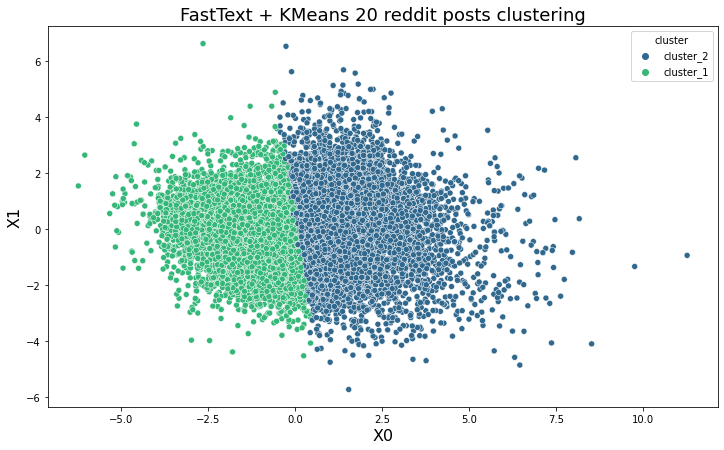

In [460]:
# set image size
plt.figure(figsize=(12, 7))
# set a title
plt.title("FastText + KMeans 20 reddit posts clustering", fontdict={"fontsize": 18})
# set axes names
plt.xlabel("X0", fontdict={"fontsize": 16})
plt.ylabel("X1", fontdict={"fontsize": 16})
# create scatter plot with seaborn, where hue is the class used to group the data
sns.scatterplot(data=df_clusters_ft, x='x0', y='x1', hue='cluster', palette="viridis")
plt.show()